In [1]:
import glob
import os

import numpy as np
import pandas as pd
import xarray as xr
from scipy.interpolate import griddata
import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import datetime

import cartopy.crs as ccrs
import cartopy.feature as cf
from cartopy.mpl.ticker import LongitudeFormatter, LatitudeFormatter
import seaborn as sns

from matplotlib.colors import LogNorm
from matplotlib.colors import LinearSegmentedColormap

In [16]:

def plot_background(ax):
    ax.add_feature(cf.COASTLINE.with_scale('10m'),facecolor="None",edgecolor="k", linewidth=0.5)
    ax.add_feature(cf.LAKES.with_scale('10m'), facecolor = 'None', edgecolor='white')

def plot_ticks(ax):
    ax.set_yticks(np.arange(ylo,yhi,2), crs = ccrs.PlateCarree())
    ax.set_xticks(np.arange(xlo,xhi,4), crs = ccrs.PlateCarree())
    ax.yaxis.set_major_formatter(LatitudeFormatter())
    ax.xaxis.set_major_formatter(LongitudeFormatter())
    
color_dict = {'lightblue': '#e9faff',
              'skyblue': '#8ce2ff',
              'ygreen': '#c3f448',
              'yellow': '#faff00',
              'yorange': '#ef0100',
              'maroon': '#690100'}

mycolorbar = LinearSegmentedColormap.from_list('mycolorbar', [
    color_dict['lightblue'],
    color_dict['skyblue'],
    color_dict['ygreen'],
    color_dict['yellow'],
    color_dict['yorange'],
    color_dict['maroon']
])

In [4]:
#loop through files
df = []
in_path = 'AHI_2019_'
out_path = 'AHI_SEA_2019_'
os.makedirs(out_path, exist_ok=True)
lati = -12
late = 22
loni = 94
lone = 129
for filepath in glob.iglob(f'{in_path}/*.txt'):
    st = filepath.split('/')[1]
    data = pd.read_csv(filepath, skiprows=44).iloc[1:]
    data = data.astype('float')
    df = data.replace(-9999,np.NaN)
    df.columns = ['Latitude', 'Longitude', 'Code', 'FRP', 'Fire Size',
           'Fire Temp', 'Line', 'Element', 'Pixel Size', 'Obs BT4',
           'Obs BT11', 'Bkg BT4', 'Bkg BT11', 'SolZen', 'SatZen',
           'RelAzi', 'Eco', 'FD_X', 'FD_Y']
    
    df_SEA = df[(df['Latitude']>=lati) & (df['Latitude']<=late) & (df['Longitude']>=loni) & (df['Longitude']<=lone)]
    
    df_SEA_code10 = df_SEA[(df_SEA['Code']==10) & (df_SEA['Latitude']<= 9)] 
    station_lats = df_SEA_code10['Latitude']
    station_lons = df_SEA_code10['Longitude']
    # Define the extent of the grid (min_lat, max_lat, min_lon, max_lon)
    
    min_lat, max_lat = lati, 9
    min_lon, max_lon = loni, lone
    
    # Calculate the number of points needed for 14 km resolution
    resolution_km = 25
    lat_points = int((max_lat - min_lat) * 111 / resolution_km)
    lon_points = int((max_lon - min_lon) * 111 / resolution_km)
    
    
    # Create the grid
    grid_lats = np.linspace(min_lat, max_lat, lat_points)
    grid_lons = np.linspace(min_lon, max_lon, lon_points)
    grid_lon, grid_lat = np.meshgrid(grid_lons, grid_lats)
    
    # Find the nearest grid points to the original station locations
    df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
    df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
    new_station_lats = []
    new_station_lons = []
    for lat, lon in zip(station_lats, station_lons):
        # Calculate the distance to each grid point
        distances = np.sqrt((grid_lat - lat)**2 + (grid_lon - lon)**2)
        # Find the index of the nearest grid point
        idx = np.argmin(distances)
        new_station_lat = grid_lat.ravel()[idx]
        new_station_lon = grid_lon.ravel()[idx]
        new_station_lats.append(new_station_lat)
        new_station_lons.append(new_station_lon)
        
    nslat = pd.DataFrame(new_station_lats, columns=['Column1'])
    nslon = pd.DataFrame(new_station_lons, columns=['Column1'])
    df_SEA_code10 = df_SEA_code10.reset_index()
    df_SEA_code10['lat_regrid'] = nslat
    df_SEA_code10['lon_regrid'] = nslon
    df_SEA_code10 = df_SEA_code10[['Latitude', 'Longitude', 'Code', 'FRP', 'Fire Size',
       'Fire Temp', 'Line', 'Element', 'Pixel Size', 'Obs BT4', 'Obs BT11',
       'Bkg BT4', 'Bkg BT11', 'SolZen', 'SatZen', 'RelAzi', 'Eco', 'FD_X',
       'FD_Y', 'lat_regrid', 'lon_regrid']]
    df_SEA_code10.to_csv(f'{out_path}/{st}')

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lat_regrid'] = df_SEA_code10['Latitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SEA_code10['lon_regrid'] = df_SEA_code10['Longitude']*0
/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/1989890196.py:42: SettingWithCopyWarning: 
A value is trying to be set o

# Open the regridded-to-25km files.

In [7]:
#loop through files
df = []
for filepath in glob.iglob('AHI_SEA_2019_/f*.txt'):
    data = pd.read_csv(filepath).iloc[:,1:]
    data = data.astype('float')
    data['file'] = os.path.basename(filepath)
    df.append(data)
df = pd.concat(df)
df

,Latitude,Longitude,Code,FRP,Fire Size,Fire Temp,Line,Element,Pixel Size,Obs BT4,...,Bkg BT11,SolZen,SatZen,RelAzi,Eco,FD_X,FD_Y,lat_regrid,lon_regrid,file
0,0.2174,101.8682,10.0,39.1,1480.0,810.5,2738.0,833.0,6217437.0,303.246,...,290.701,87.292,45.125,NaN,33.0,834.0,2739.0,0.326087,101.954545,f2019207233000.firelist.6_6_001g.FDCFLDK.HIMAW...
1,-2.5724,121.3740,10.0,104.4,3923.0,811.9,2890.0,1707.0,4474883.0,321.410,...,285.189,70.033,22.899,NaN,36.0,1708.0,2891.0,-2.641304,121.272727,f2019207233000.firelist.6_6_001g.FDCFLDK.HIMAW...
0,1.9053,100.7341,10.0,46.8,6019.0,640.3,2649.0,792.0,6396831.0,303.652,...,286.317,169.676,46.454,NaN,33.0,793.0,2650.0,1.923913,100.818182,f2019264175000.firelist.6_6_001g.FDCFLDK.HIMAW...
1,1.8472,101.0347,10.0,170.2,6555.0,807.6,2652.0,803.0,6349633.0,323.714,...,286.502,169.402,46.114,NaN,33.0,804.0,2653.0,1.923913,101.045455,f2019264175000.firelist.6_6_001g.FDCFLDK.HIMAW...
2,1.8471,101.0617,10.0,251.3,4682.0,956.7,2652.0,804.0,6345694.0,332.371,...,286.502,169.376,46.084,NaN,33.0,805.0,2653.0,1.923913,101.045455,f2019264175000.firelist.6_6_001g.FDCFLDK.HIMAW...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1,2.0707,117.1717,10.0,75.1,763.0,1128.6,2637.0,1498.0,4705582.0,317.043,...,293.038,128.669,27.688,NaN,33.0,1499.0,2638.0,2.152174,117.181818,f2019200131000.firelist.6_6_001g.FDCFLDK.HIMAW...
2,1.4961,104.2325,10.0,52.3,5682.0,659.5,2670.0,925.0,5896326.0,308.724,...,292.787,117.405,42.469,NaN,36.0,926.0,2671.0,1.467391,104.227273,f2019200131000.firelist.6_6_001g.FDCFLDK.HIMAW...
3,-0.0282,103.2033,10.0,32.9,5371.0,615.1,2751.0,884.0,6028172.0,303.652,...,293.928,117.097,43.605,NaN,33.0,885.0,2752.0,-0.130435,103.090909,f2019200131000.firelist.6_6_001g.FDCFLDK.HIMAW...
4,-2.5724,121.3740,10.0,22.2,1118.0,763.5,2890.0,1707.0,4474883.0,301.443,...,290.860,134.580,22.887,NaN,36.0,1708.0,2891.0,-2.641304,121.272727,f2019200131000.firelist.6_6_001g.FDCFLDK.HIMAW...


In [8]:
df = df.replace(-9999,np.NaN)
df['Year'] = df['file'].str.slice(1, 5).astype('int')
df['Day'] = df['file'].str.slice(5, 8).astype('int')
df['Hour'] = df['file'].str.slice(8, 10).astype('str')
df['Min'] = df['file'].str.slice(10, 12).astype('str')
df.columns = ['Latitude', 'Longitude', 'Code', 'FRP', 'Fire Size',
           'Fire Temp', 'Line', 'Element', 'Pixel Size', 'Obs BT4',
           'Obs BT11', 'Bkg BT4', 'Bkg BT11', 'SolZen', 'SatZen',
           'RelAzi', 'Eco', 'FD_X', 'FD_Y','lat_regrid','lon_regrid','file','Year','Day','Hour','Min']
df = df[['Latitude', 'Longitude', 'Code', 'FRP', 'Fire Size',
           'Fire Temp', 'Line', 'Element', 'Pixel Size', 'Obs BT4',
           'Obs BT11', 'Bkg BT4', 'Bkg BT11', 'SolZen', 'SatZen',
           'RelAzi', 'Eco', 'FD_X', 'FD_Y','lat_regrid','lon_regrid','Year','Day','Hour','Min']]
df

,Latitude,Longitude,Code,FRP,Fire Size,Fire Temp,Line,Element,Pixel Size,Obs BT4,...,RelAzi,Eco,FD_X,FD_Y,lat_regrid,lon_regrid,Year,Day,Hour,Min
0,0.2174,101.8682,10.0,39.1,1480.0,810.5,2738.0,833.0,6217437.0,303.246,...,NaN,33.0,834.0,2739.0,0.326087,101.954545,2019,207,23,30
1,-2.5724,121.3740,10.0,104.4,3923.0,811.9,2890.0,1707.0,4474883.0,321.410,...,NaN,36.0,1708.0,2891.0,-2.641304,121.272727,2019,207,23,30
0,1.9053,100.7341,10.0,46.8,6019.0,640.3,2649.0,792.0,6396831.0,303.652,...,NaN,33.0,793.0,2650.0,1.923913,100.818182,2019,264,17,50
1,1.8472,101.0347,10.0,170.2,6555.0,807.6,2652.0,803.0,6349633.0,323.714,...,NaN,33.0,804.0,2653.0,1.923913,101.045455,2019,264,17,50
2,1.8471,101.0617,10.0,251.3,4682.0,956.7,2652.0,804.0,6345694.0,332.371,...,NaN,33.0,805.0,2653.0,1.923913,101.045455,2019,264,17,50
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1,2.0707,117.1717,10.0,75.1,763.0,1128.6,2637.0,1498.0,4705582.0,317.043,...,NaN,33.0,1499.0,2638.0,2.152174,117.181818,2019,200,13,10
2,1.4961,104.2325,10.0,52.3,5682.0,659.5,2670.0,925.0,5896326.0,308.724,...,NaN,36.0,926.0,2671.0,1.467391,104.227273,2019,200,13,10
3,-0.0282,103.2033,10.0,32.9,5371.0,615.1,2751.0,884.0,6028172.0,303.652,...,NaN,33.0,885.0,2752.0,-0.130435,103.090909,2019,200,13,10
4,-2.5724,121.3740,10.0,22.2,1118.0,763.5,2890.0,1707.0,4474883.0,301.443,...,NaN,36.0,1708.0,2891.0,-2.641304,121.272727,2019,200,13,10


In [9]:
def convert_to_date(x):
    return datetime.date(2019,1,1)+datetime.timedelta(days=x)

df['date'] = df['Day'].apply(convert_to_date)

In [10]:
df_SEA_code10 = df
df_SEA_code10['datetime'] = pd.to_datetime(df_SEA_code10['date'].apply(str) + ' ' + df_SEA_code10['Hour'].apply(str) + ':'+ df_SEA_code10['Min'].apply(str) +':00')

# Group by new lat, lon, datetime. Take the total FRP per gridpoint.

In [11]:
df_c10_sumFRP = df_SEA_code10[['lat_regrid','lon_regrid','datetime','FRP']].groupby(by =["lat_regrid","lon_regrid","datetime"]).agg(['mean', 'sum','std','count']).set_axis(['mean_FRP', 'sum_FRP','std_FRP','count_FRP'], axis=1).reset_index()
df_c10_sumFRP['hour'] = df_c10_sumFRP.datetime.dt.hour
df_c10_sumFRP

,lat_regrid,lon_regrid,datetime,mean_FRP,sum_FRP,std_FRP,count_FRP,hour
0,-10.858696,122.863636,2019-09-01 04:20:00,23.7,23.7,NaN,1,4
1,-10.858696,123.090909,2019-08-13 05:30:00,49.6,49.6,NaN,1,5
2,-10.858696,123.090909,2019-08-13 05:40:00,108.4,108.4,NaN,1,5
3,-10.858696,123.090909,2019-08-13 05:50:00,48.1,48.1,NaN,1,5
4,-10.858696,123.090909,2019-08-13 06:00:00,55.3,55.3,NaN,1,6
...,...,...,...,...,...,...,...,...
121199,9.000000,126.045455,2019-09-19 05:20:00,56.9,56.9,NaN,1,5
121200,9.000000,126.045455,2019-09-19 06:10:00,52.2,52.2,NaN,1,6
121201,9.000000,126.045455,2019-09-23 05:20:00,31.5,31.5,NaN,1,5
121202,9.000000,126.272727,2019-08-11 03:00:00,29.6,29.6,NaN,1,3


# What is the hourly average of the total FRP per grid cell?

In [12]:
df_c10_hourlyavg_sumFRP = df_c10_sumFRP[['lat_regrid','lon_regrid','hour','sum_FRP']].groupby(by =['lat_regrid','lon_regrid','hour']).agg(['mean','std','count']).set_axis(['mean_FRP','std_FRP','count_FRP'], axis=1).reset_index()
df_c10_hourlyavg_sumFRP['y_error-'] = df_c10_hourlyavg_sumFRP['mean_FRP'] - df_c10_hourlyavg_sumFRP['std_FRP']
df_c10_hourlyavg_sumFRP['y_error+'] = df_c10_hourlyavg_sumFRP['mean_FRP'] + df_c10_hourlyavg_sumFRP['std_FRP']
df_c10_hourlyavg_sumFRP

,lat_regrid,lon_regrid,hour,mean_FRP,std_FRP,count_FRP,y_error-,y_error+
0,-10.858696,122.863636,4,23.700000,NaN,1,NaN,NaN
1,-10.858696,123.090909,3,36.300000,NaN,1,NaN,NaN
2,-10.858696,123.090909,5,68.700000,34.389388,3,34.310612,103.089388
3,-10.858696,123.090909,6,50.000000,27.345749,7,22.654251,77.345749
4,-10.858696,123.090909,7,35.266667,9.494139,6,25.772528,44.760805
...,...,...,...,...,...,...,...,...
15817,9.000000,126.045455,3,27.900000,0.565685,2,27.334315,28.465685
15818,9.000000,126.045455,5,42.900000,10.480458,4,32.419542,53.380458
15819,9.000000,126.045455,6,52.200000,NaN,1,NaN,NaN
15820,9.000000,126.272727,3,29.600000,NaN,1,NaN,NaN


# Make a map of the hourly average of the total FRP per grid cell

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/3963397914.py:11: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure(figsize=(11,8.5), constrained_layout=True)


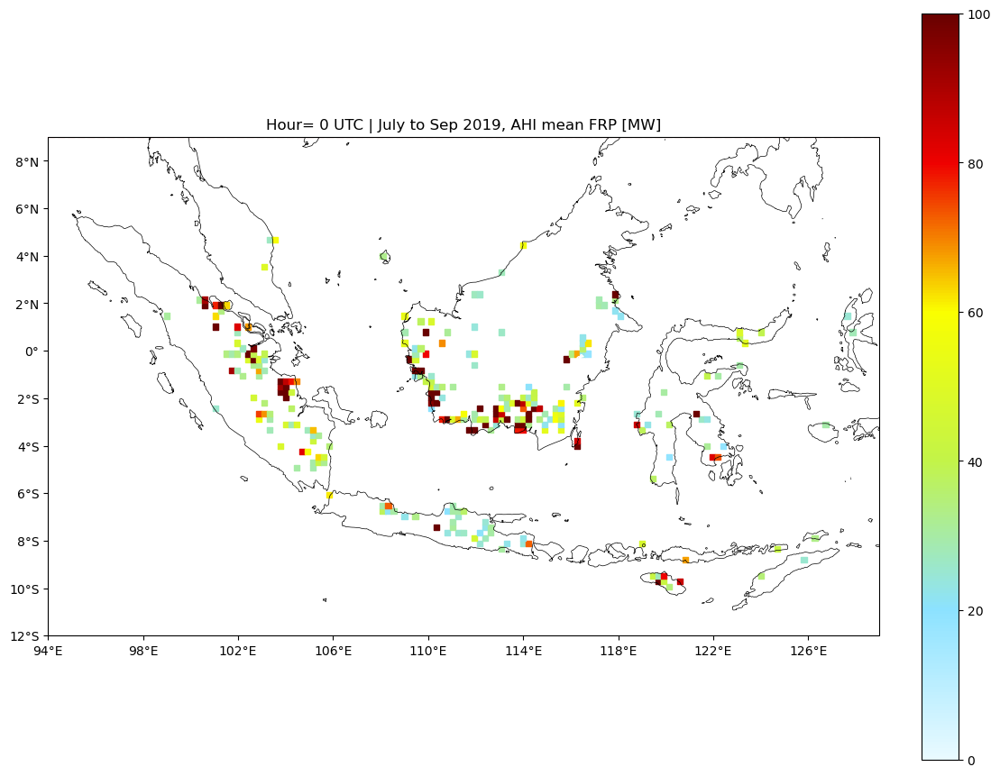

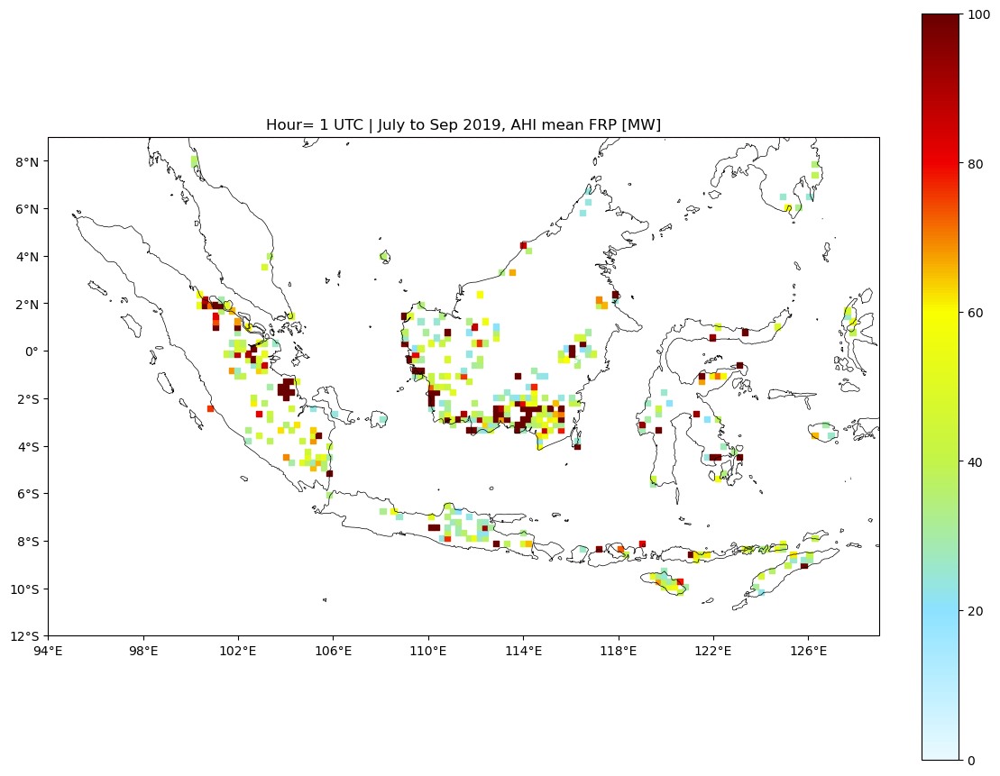

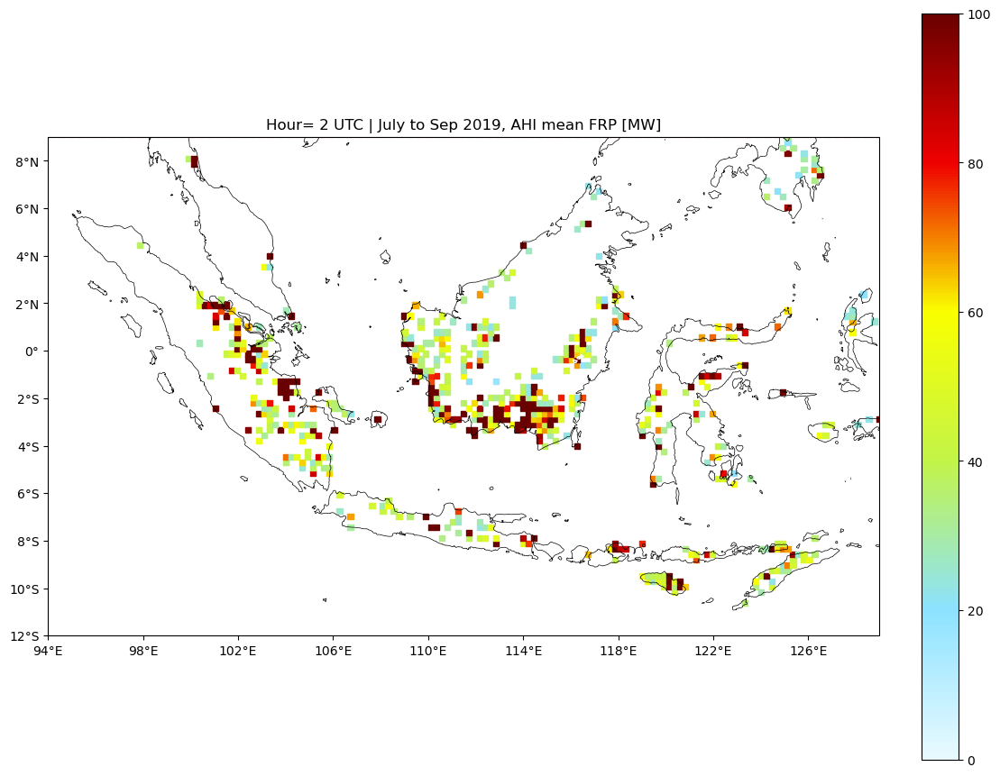

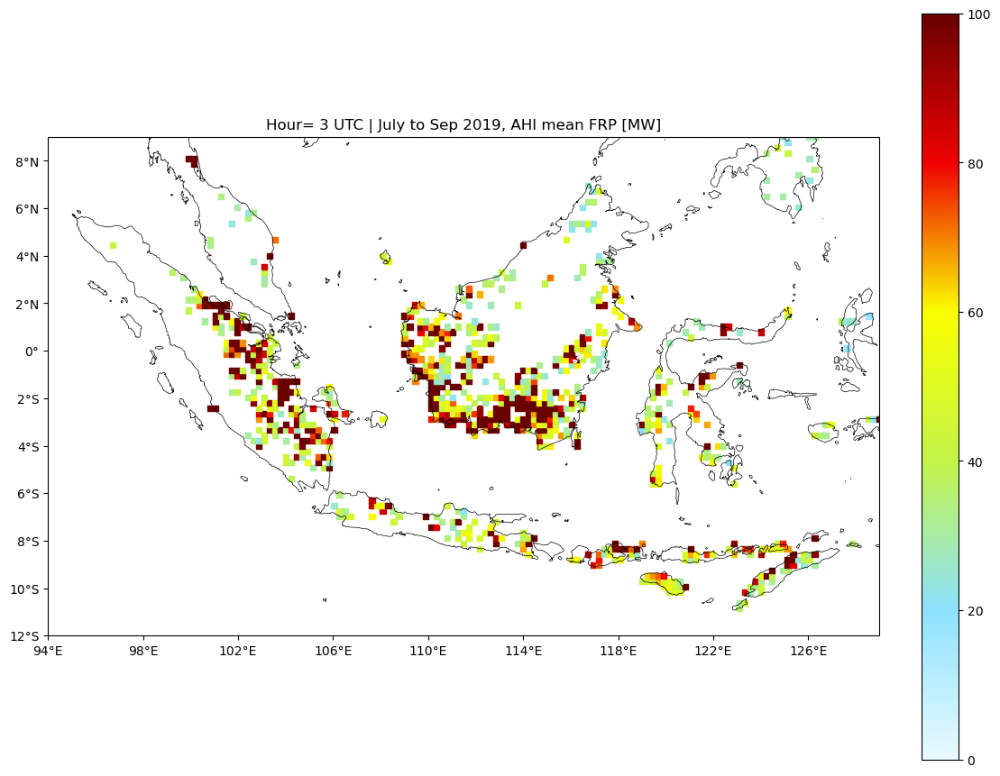

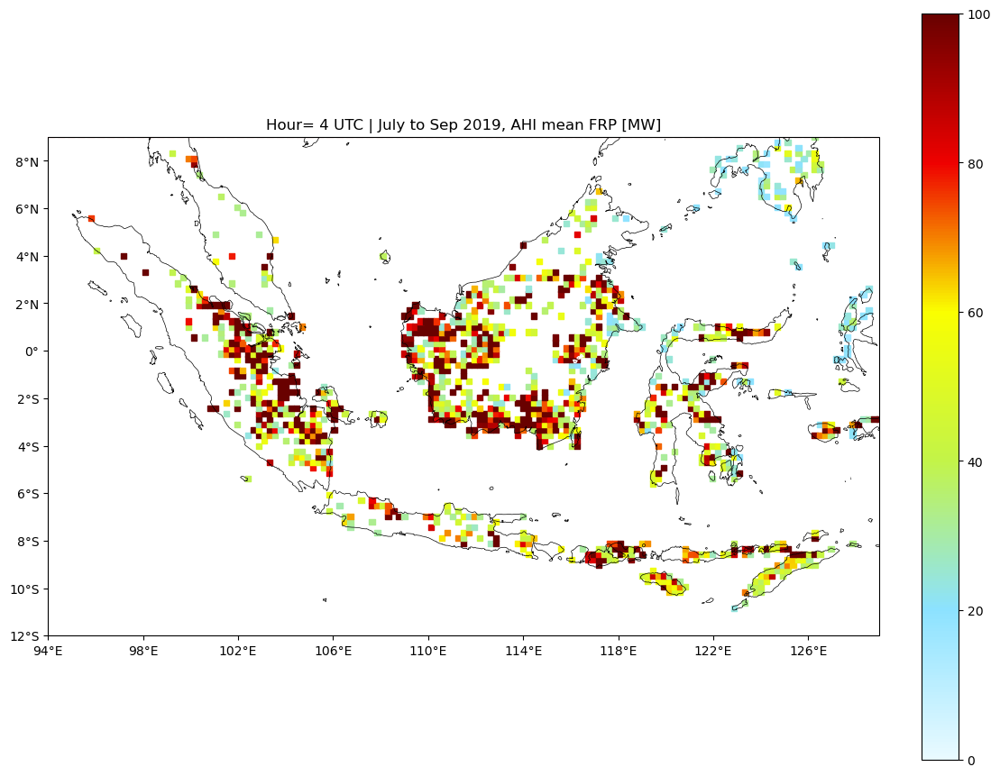

...

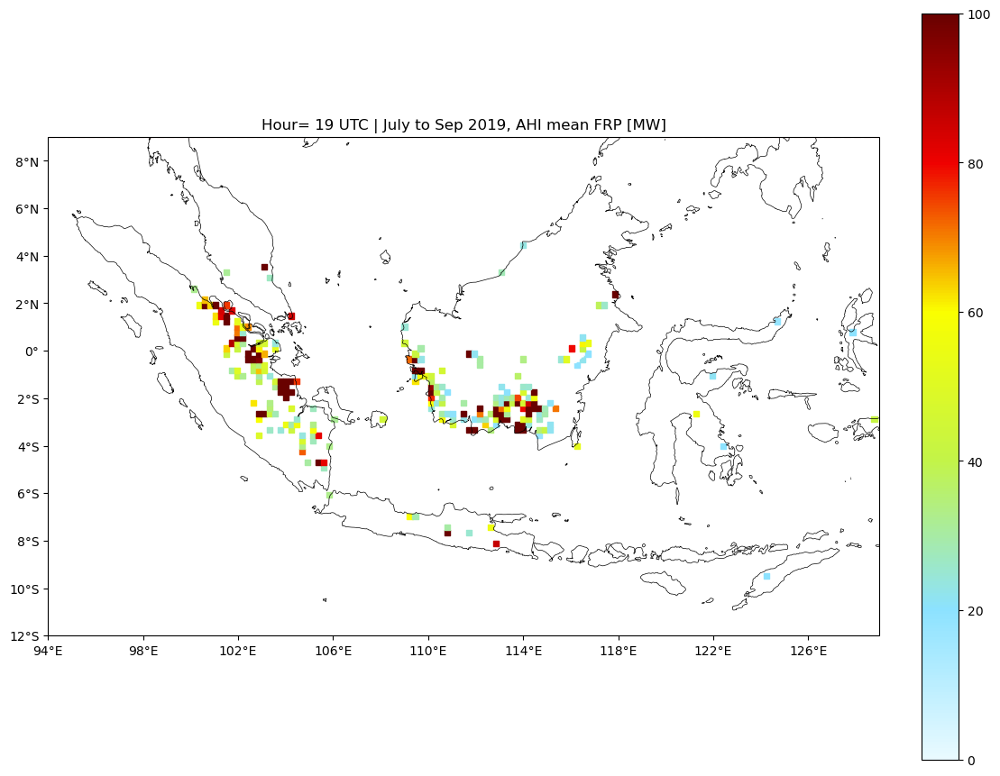

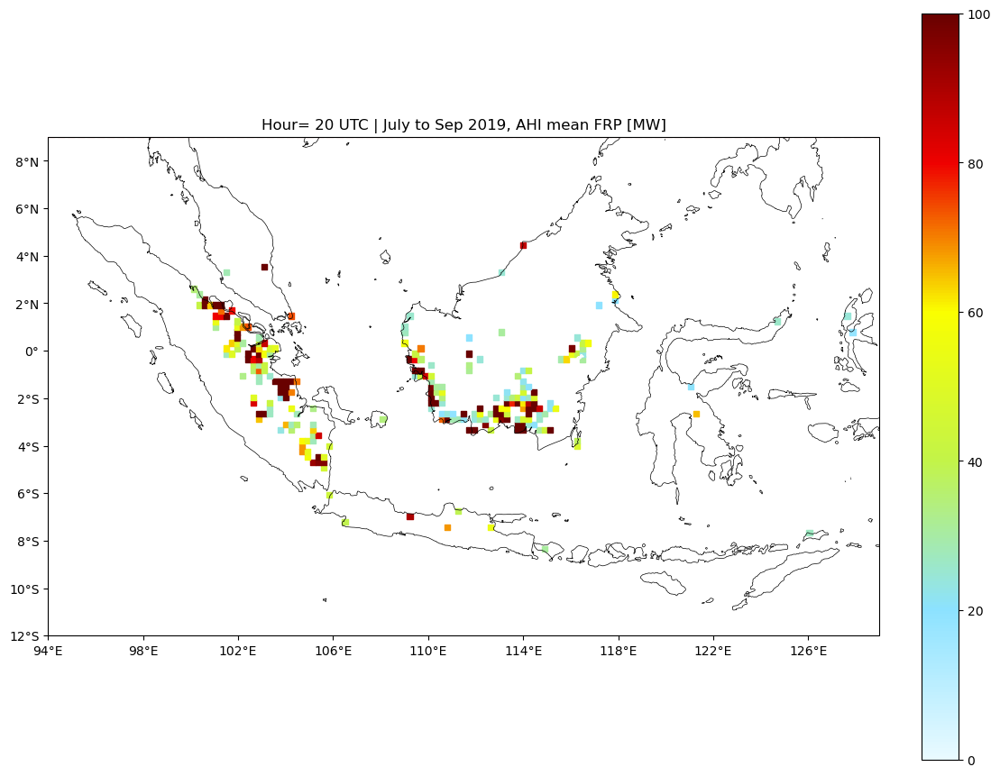

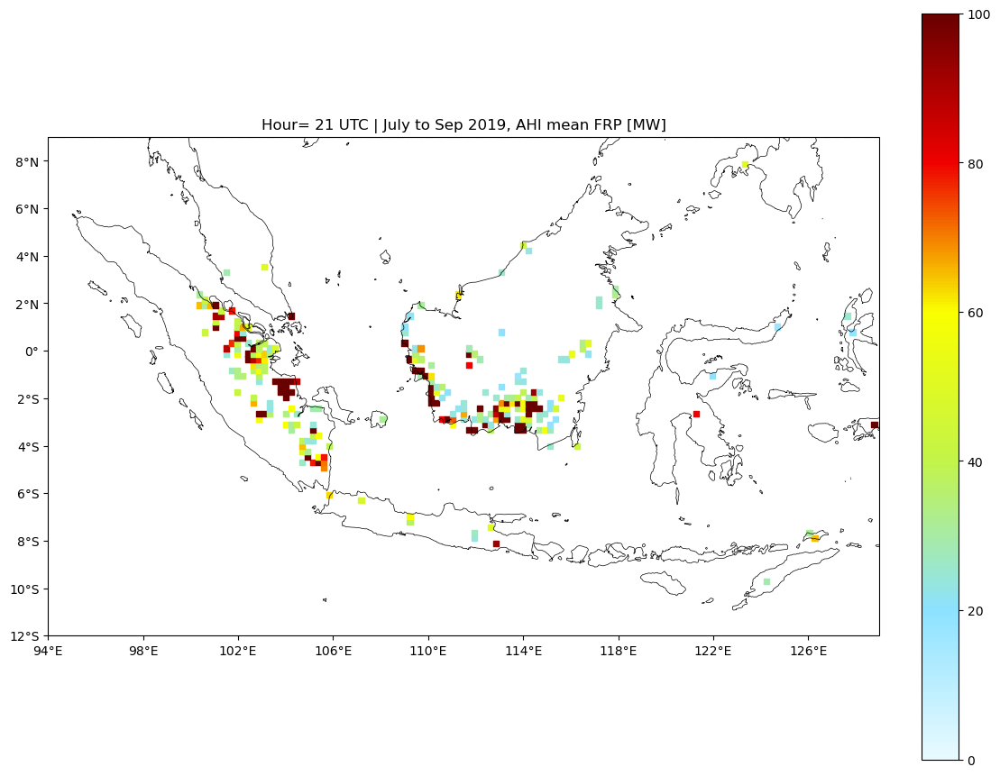

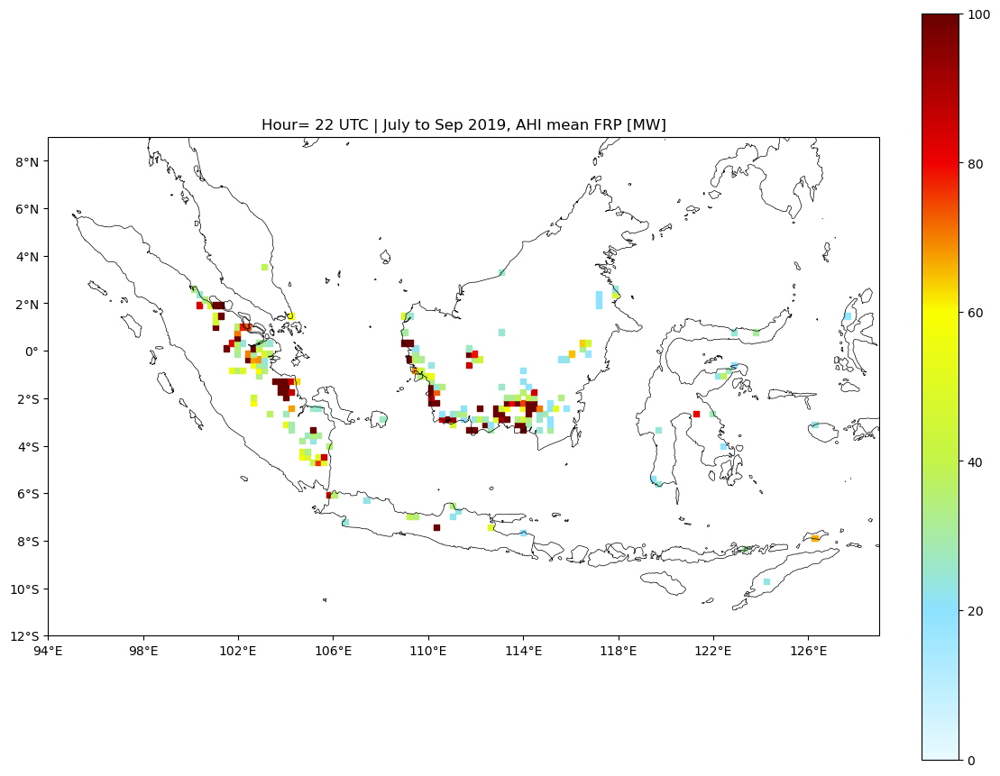

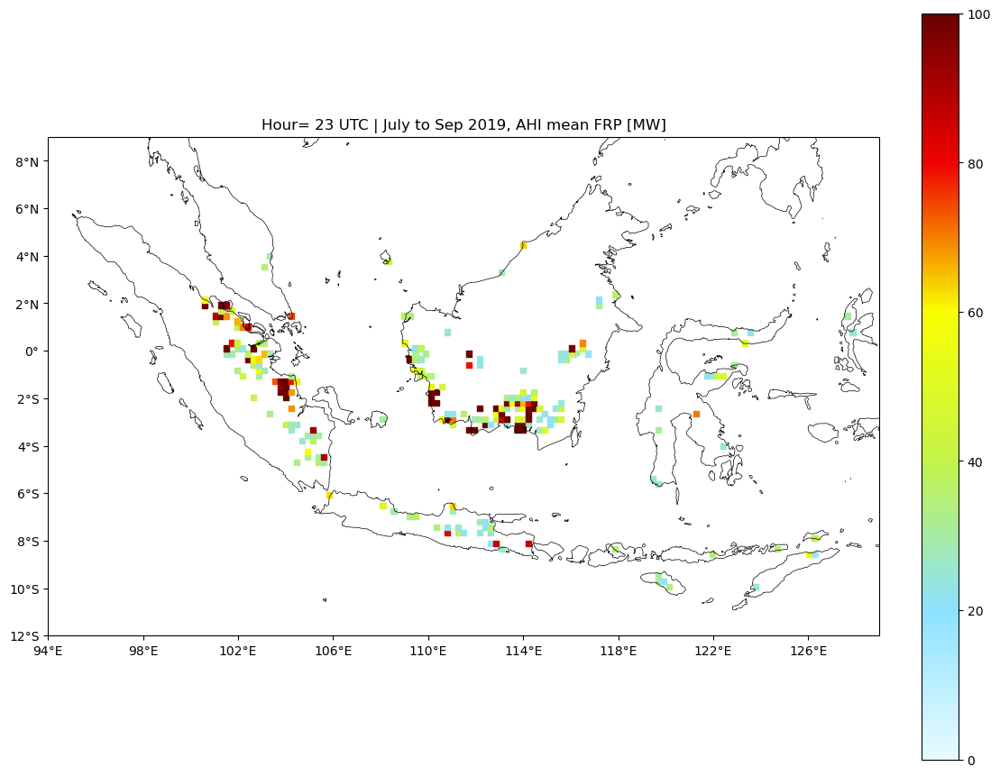

In [21]:
xlo = loni
xhi = lone
ylo = lati
yhi = late

data_crs = ccrs.PlateCarree()

for i in np.arange(0, 24, 1):
    df__ = df_c10_hourlyavg_sumFRP[df_c10_hourlyavg_sumFRP["hour"].apply(int) == i]

    fig = plt.figure(figsize=(11,8.5), constrained_layout=True)
    gs = fig.add_gridspec(1,1)
    ax0 = fig.add_subplot(gs[0,0], projection = ccrs.PlateCarree())
    plot_background(ax0)
    plot_ticks(ax0)
    cs = ax0.scatter(df__["lon_regrid"], df__["lat_regrid"], c=df__["mean_FRP"], cmap=mycolorbar,marker='s',s=20,vmin=0,vmax=100,transform=ccrs.PlateCarree())
    
    ax0.set_xlim(xlo,xhi)
    ax0.set_ylim(ylo,9)
    ax0.axhline(y=9, linestyle='--',color='red')
    plt.title(f"Hour= {i} UTC | July to Sep 2019, AHI mean FRP [MW]")
    cb = fig.colorbar(cs)
    plt.savefig(f"img/AHI/SEA_{i}_25km_frp_map.png")


In [22]:
df_c10_sumFRP

,lat_regrid,lon_regrid,datetime,mean_FRP,sum_FRP,std_FRP,count_FRP,hour
0,-10.858696,122.863636,2019-09-01 04:20:00,23.7,23.7,NaN,1,4
1,-10.858696,123.090909,2019-08-13 05:30:00,49.6,49.6,NaN,1,5
2,-10.858696,123.090909,2019-08-13 05:40:00,108.4,108.4,NaN,1,5
3,-10.858696,123.090909,2019-08-13 05:50:00,48.1,48.1,NaN,1,5
4,-10.858696,123.090909,2019-08-13 06:00:00,55.3,55.3,NaN,1,6
...,...,...,...,...,...,...,...,...
121199,9.000000,126.045455,2019-09-19 05:20:00,56.9,56.9,NaN,1,5
121200,9.000000,126.045455,2019-09-19 06:10:00,52.2,52.2,NaN,1,6
121201,9.000000,126.045455,2019-09-23 05:20:00,31.5,31.5,NaN,1,5
121202,9.000000,126.272727,2019-08-11 03:00:00,29.6,29.6,NaN,1,3


# Select 2019-07-31 , then group by hour. 
### For now, just get the frequency of Fire Detection for each gridcell.

In [45]:
df_c10_sumFRP_seldate = df_c10_sumFRP[(df_c10_sumFRP['datetime']>='2019-07-31 00:00:00') & (df_c10_sumFRP['datetime']<'2019-08-01 00:00:00')]
df_c10_sumFRP_seldate

,lat_regrid,lon_regrid,datetime,mean_FRP,sum_FRP,std_FRP,count_FRP,hour
182,-10.173913,120.590909,2019-07-31 06:30:00,25.60,25.6,NaN,1,6
282,-9.945652,119.909091,2019-07-31 03:00:00,47.40,47.4,NaN,1,3
283,-9.945652,119.909091,2019-07-31 03:10:00,32.50,32.5,NaN,1,3
454,-9.945652,120.136364,2019-07-31 02:30:00,26.70,26.7,NaN,1,2
455,-9.945652,120.136364,2019-07-31 02:50:00,66.15,132.3,38.678741,2,2
...,...,...,...,...,...,...,...,...
120918,8.086957,100.136364,2019-07-31 06:20:00,70.90,70.9,NaN,1,6
120919,8.086957,100.136364,2019-07-31 06:30:00,88.55,177.1,21.991021,2,6
120920,8.086957,100.136364,2019-07-31 07:40:00,59.90,59.9,NaN,1,7
120921,8.086957,100.136364,2019-07-31 08:00:00,58.60,58.6,NaN,1,8


### per hour

In [51]:
df_c10_hourlyavg_seldate_count = df_c10_sumFRP_seldate[['lat_regrid','lon_regrid','hour','count_FRP']].groupby(['lat_regrid','lon_regrid','hour']).agg(['sum']).set_axis(['count_FRP_hr'],axis=1).reset_index()
df_c10_hourlyavg_seldate_count[df_c10_hourlyavg_seldate_count['count_FRP_hr']>9]

,lat_regrid,lon_regrid,hour,count_FRP_hr
369,1.010870,109.909091,5,14
371,1.010870,110.136364,4,14
372,1.010870,110.136364,5,13
402,2.152174,100.363636,8,10


# Make a map of the hourly frequency of Fire Detection for each gridcell.

/var/folders/n8/_5lr4ytd691827bdc5_mtzyc0000gq/T/ipykernel_24451/3037511727.py:11: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure(figsize=(11,8.5), constrained_layout=True)


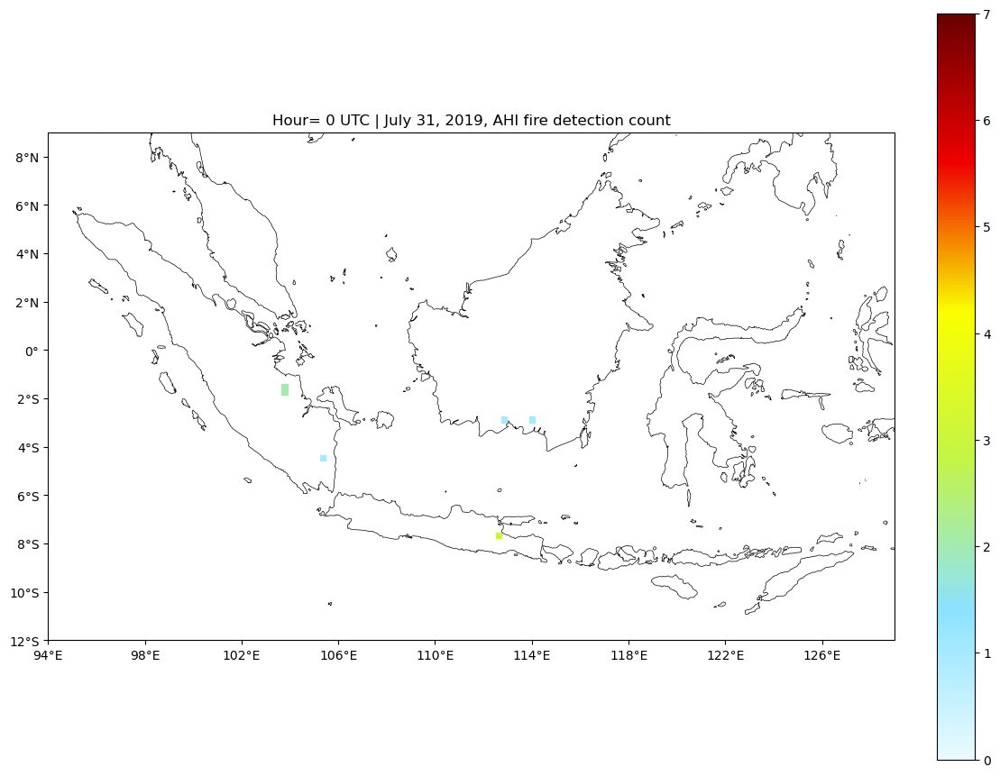

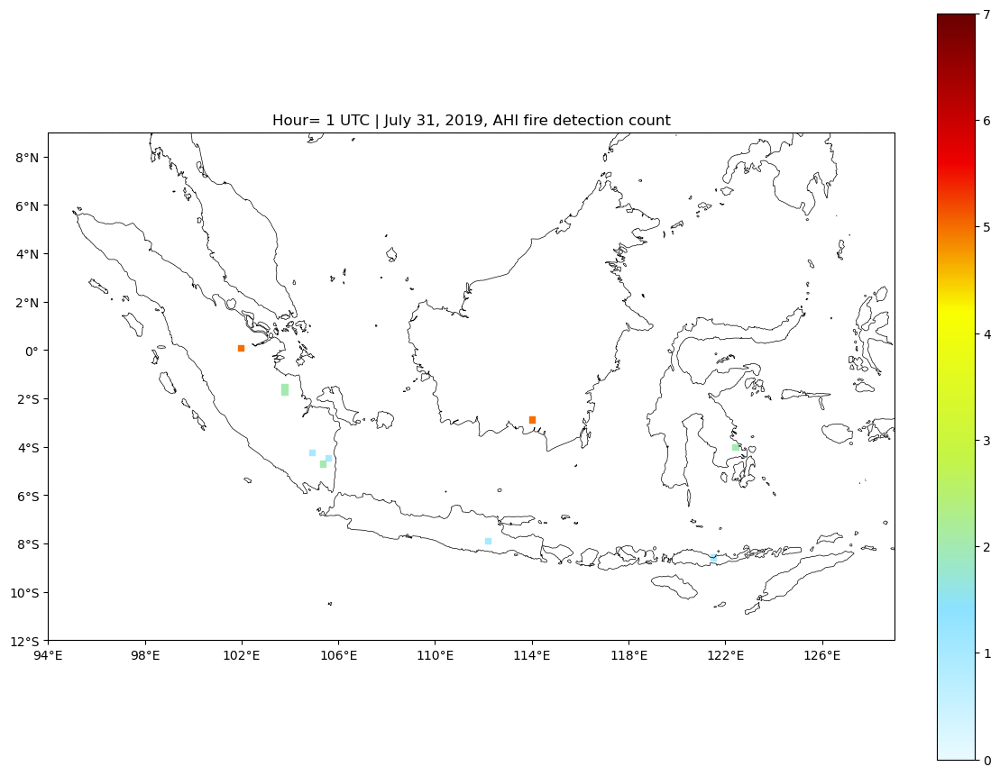

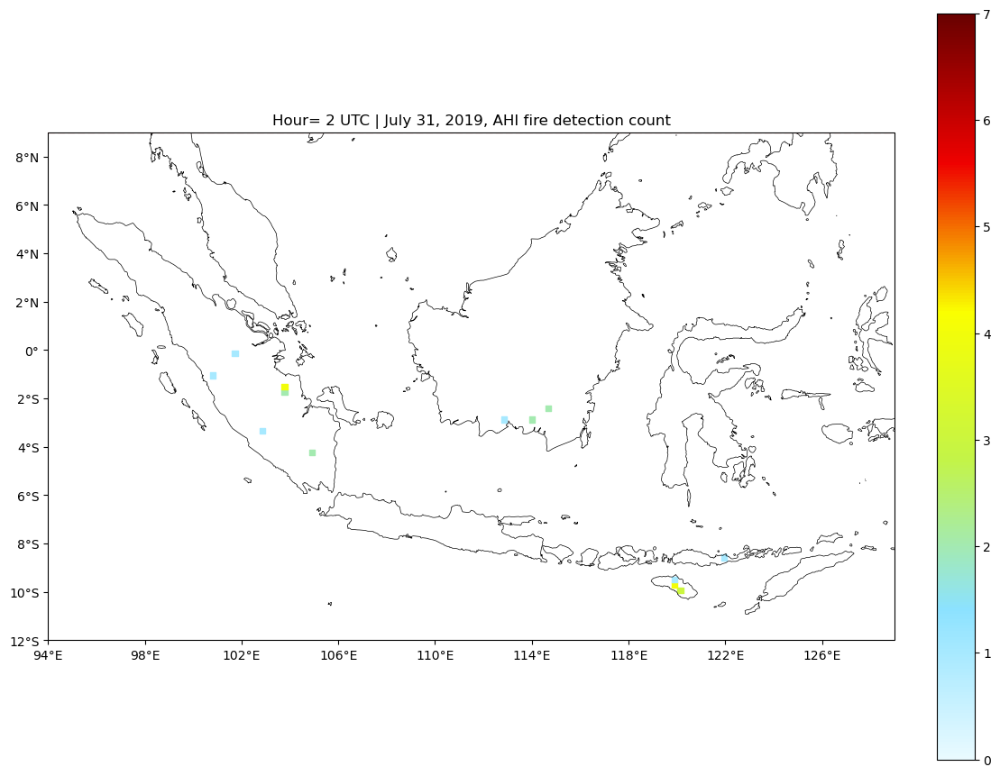

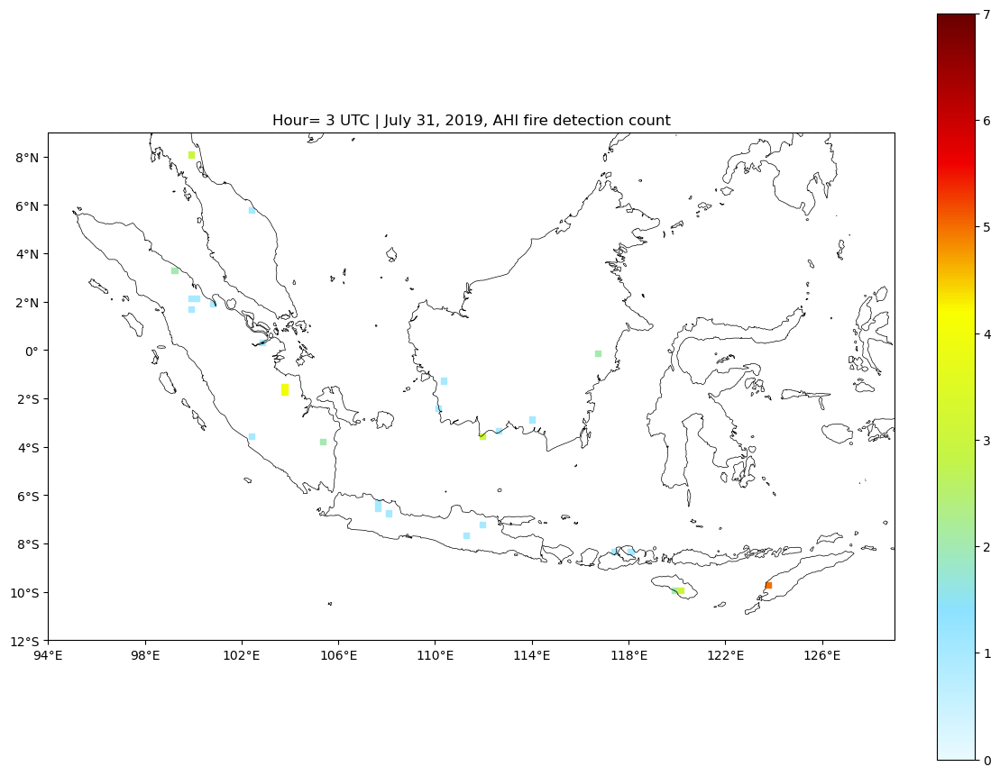

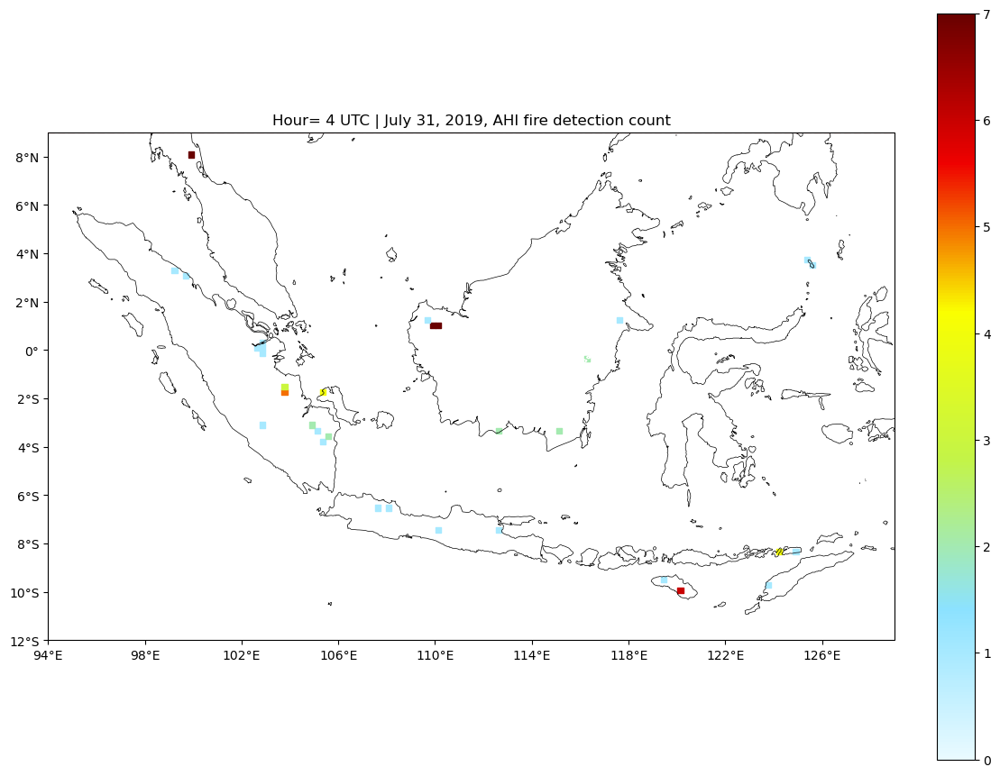

...

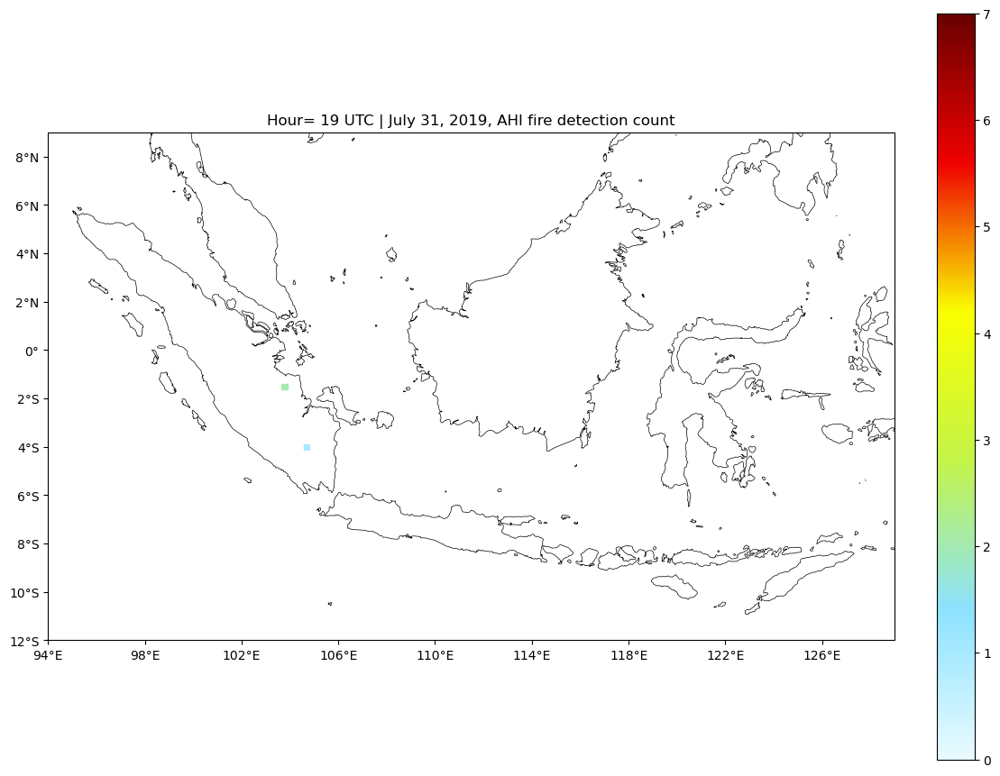

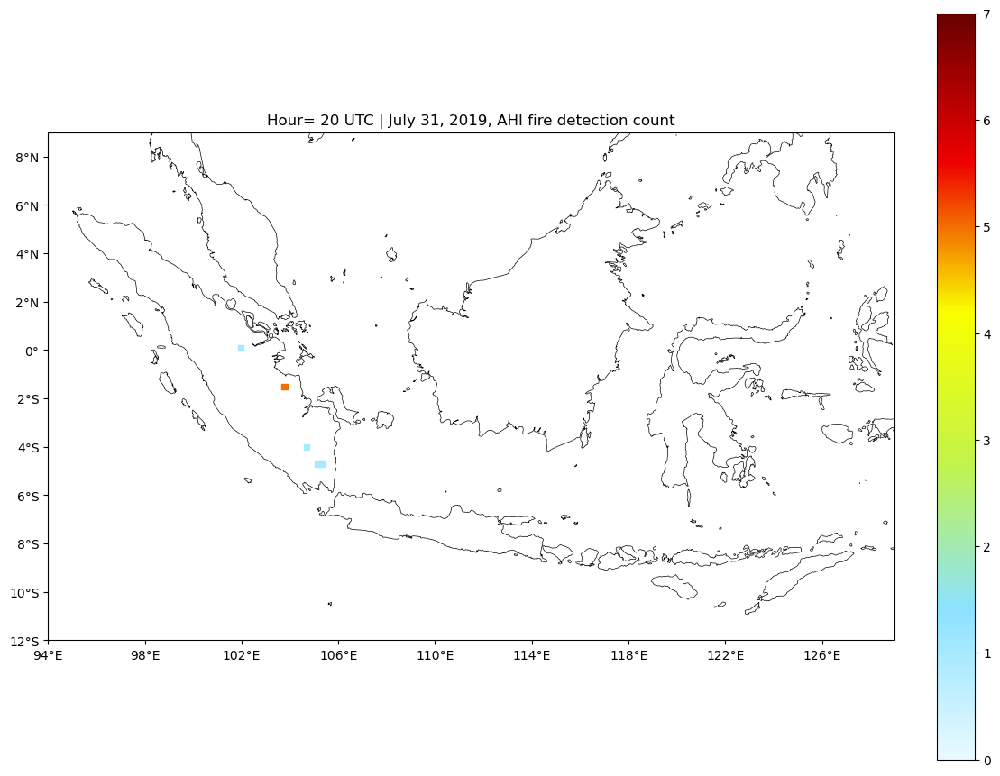

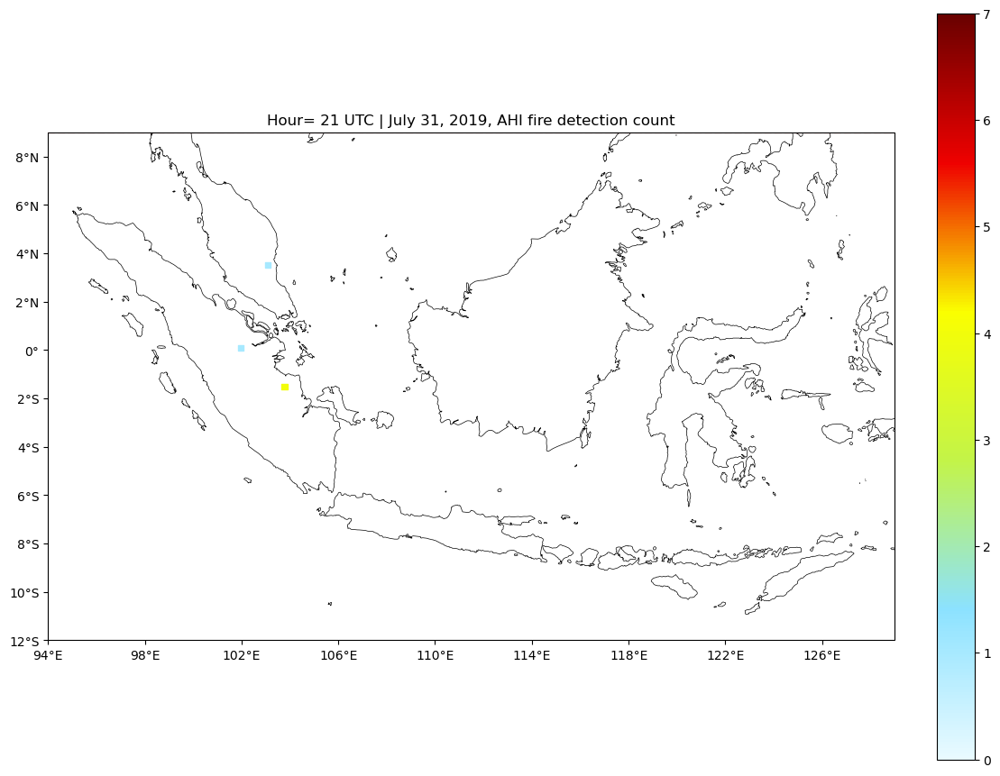

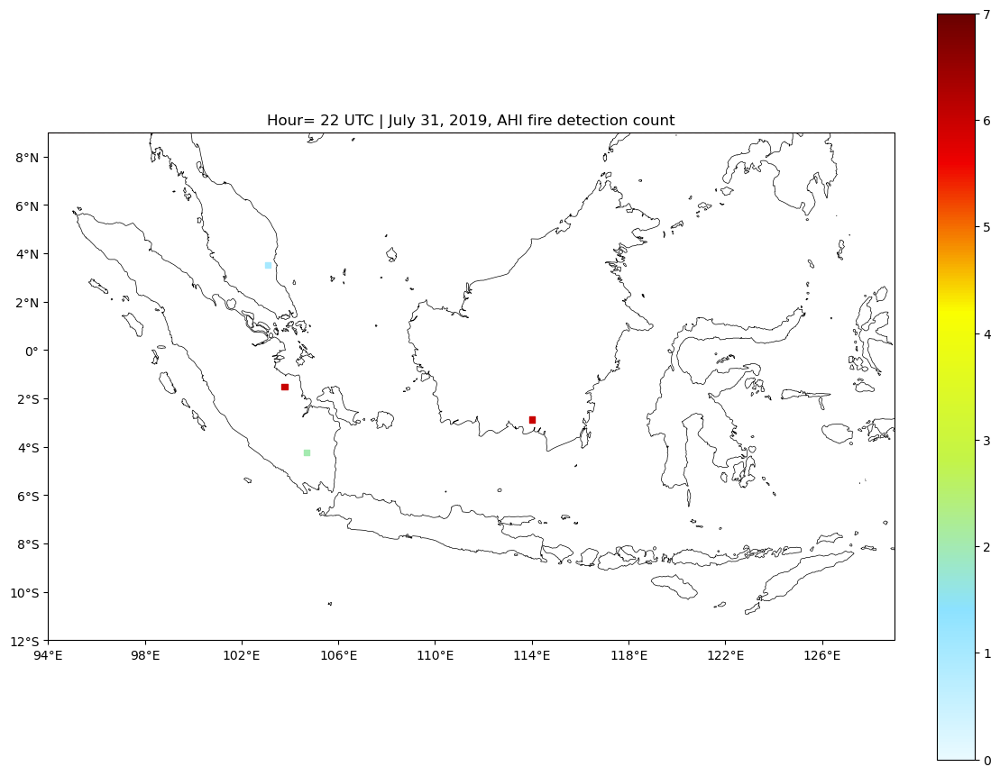

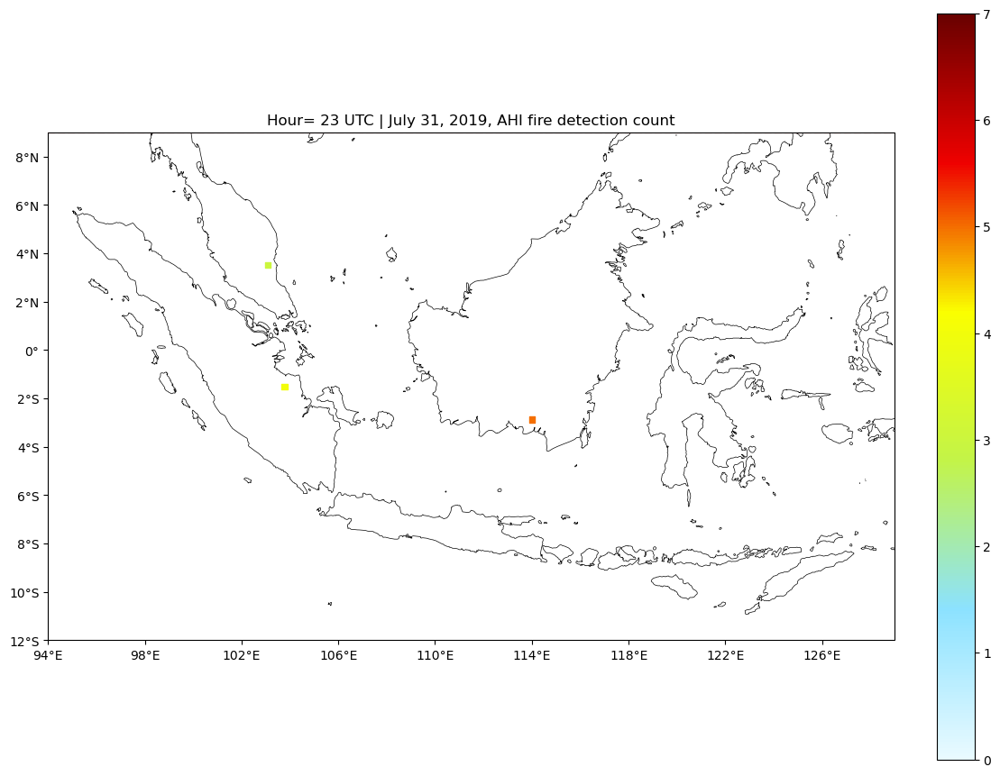

In [44]:
xlo = loni
xhi = lone
ylo = lati
yhi = late

data_crs = ccrs.PlateCarree()

for i in np.arange(0, 24, 1):
    df__ = df_c10_hourlyavg_seldate_count[df_c10_hourlyavg_seldate_count["hour"].apply(int) == i]

    fig = plt.figure(figsize=(11,8.5), constrained_layout=True)
    gs = fig.add_gridspec(1,1)
    ax0 = fig.add_subplot(gs[0,0], projection = ccrs.PlateCarree())
    plot_background(ax0)
    plot_ticks(ax0)
    cs = ax0.scatter(df__["lon_regrid"], df__["lat_regrid"], c=df__["count_FRP_hr"], cmap=mycolorbar,marker='s',s=20,vmin=0,vmax=7,transform=ccrs.PlateCarree())
    
    ax0.set_xlim(xlo,xhi)
    ax0.set_ylim(ylo,9)
    ax0.axhline(y=9, linestyle='--',color='red')
    plt.title(f"Hour= {i} UTC | July 31, 2019, AHI fire detection count")
    cb = fig.colorbar(cs)
    plt.savefig(f"img/AHI/SEA_{i}_25km_countfrp_map.png")


# per day

In [48]:
df_c10_hourlyavg_seldate_count = df_c10_sumFRP_seldate[['lat_regrid','lon_regrid','count_FRP']].groupby(['lat_regrid','lon_regrid']).agg(['sum']).set_axis(['count_FRP_hr'],axis=1).reset_index()
df_c10_hourlyavg_seldate_count.max()

lat_regrid        8.086957
lon_regrid      126.272727
count_FRP_hr     53.000000
dtype: float64

# Make a map of the daily frequency of Fire Detection for each gridcell.

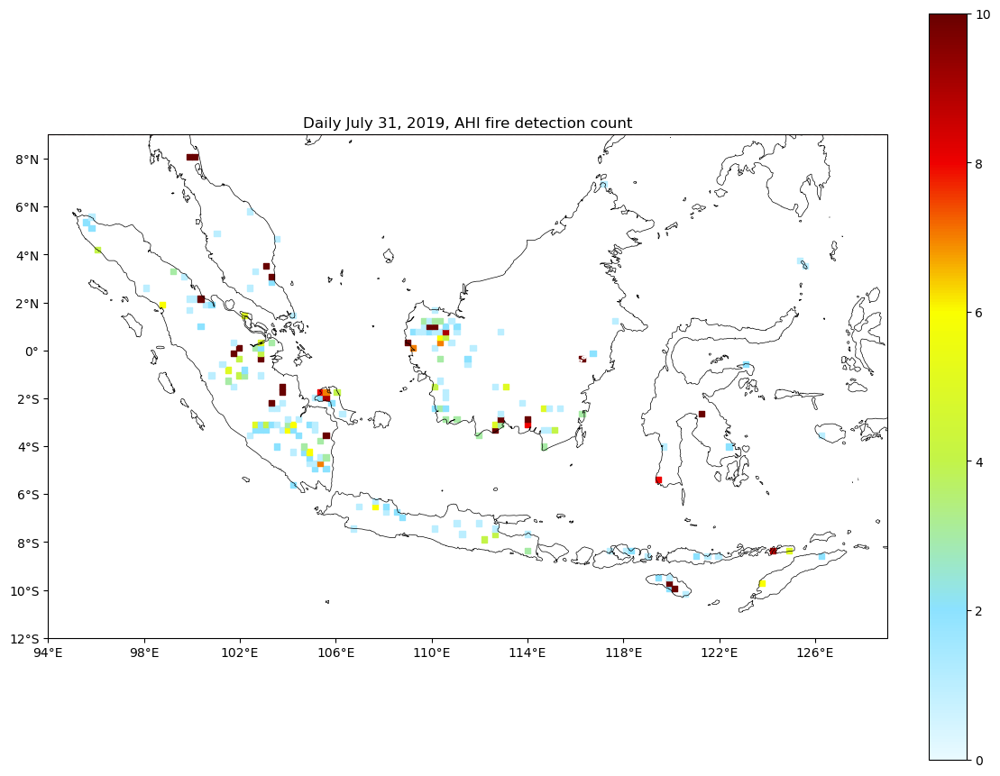

In [50]:
xlo = loni
xhi = lone
ylo = lati
yhi = late

data_crs = ccrs.PlateCarree()
df__ = df_c10_hourlyavg_seldate_count

fig = plt.figure(figsize=(11,8.5), constrained_layout=True)
gs = fig.add_gridspec(1,1)
ax0 = fig.add_subplot(gs[0,0], projection = ccrs.PlateCarree())
plot_background(ax0)
plot_ticks(ax0)
cs = ax0.scatter(df__["lon_regrid"], df__["lat_regrid"], c=df__["count_FRP_hr"], cmap=mycolorbar,marker='s',s=20,vmin=0,vmax=10,transform=ccrs.PlateCarree())

ax0.set_xlim(xlo,xhi)
ax0.set_ylim(ylo,9)
ax0.axhline(y=9, linestyle='--',color='red')
plt.title(f"Daily July 31, 2019, AHI fire detection count")
cb = fig.colorbar(cs)
plt.savefig(f"img/AHI/SEA_daily_25km_countfrp_map.png")
